In [1]:
# Options

sample_data_file = "sample.csv"

In [2]:
# Imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ast

from tqdm import tqdm
from PIL import Image, ImageDraw
from glob import glob
from dask import bag

In [3]:
num_classes = 340
imheight, imwidth = 32, 32
ims_per_class = 2000

In [4]:
df = pd.read_csv(sample_data_file)
df.head()

,drawing,word,recognized
0,"[[[99, 82, 82, 77, 70, 65, 60, 60, 66, 72, 76,...",airplane,False
1,"[[[7, 22, 54, 125, 142, 248], [89, 80, 72, 66,...",airplane,True
2,"[[[66, 35, 10, 1, 2, 7, 18, 49, 75, 85, 92, 94...",airplane,True
3,"[[[3, 21, 25, 35, 47, 70, 139, 243, 251, 254, ...",airplane,True
4,"[[[110, 97, 80, 77, 76, 82, 88, 109, 146], [11...",airplane,True


In [5]:
# get one recognized and one unrecognized image of the same word
words = df.word.unique()

drawlist = []
for word in words:
    recognized_image = df[(df['word'] == word) & (df['recognized'] == True)].head(1)
    unrecognized_image = df[(df['word'] == word) & (df['recognized'] == False)].head(1)
    drawlist.append(recognized_image)
    drawlist.append(unrecognized_image)
draw_df = pd.DataFrame(np.concatenate(drawlist), columns=df.columns)

In [6]:
evens = [i for i in range(len(draw_df)) if not (i % 2)]
odds = [i for i in range(len(draw_df)) if (i % 2)]

df1 = draw_df[draw_df.index.isin(evens)]
df2 = draw_df[draw_df.index.isin(odds)]

example1s = [ast.literal_eval(pts) for pts in df1.drawing.values]
example2s = [ast.literal_eval(pts) for pts in df2.drawing.values]

c:\users\jordi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  
c:\users\jordi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


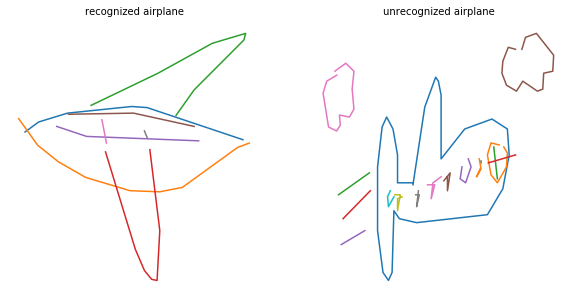

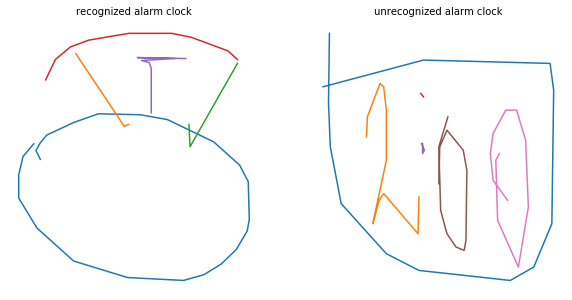

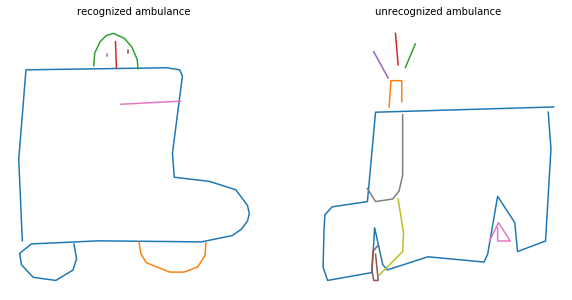

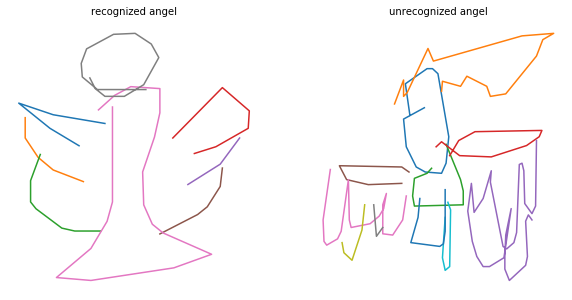

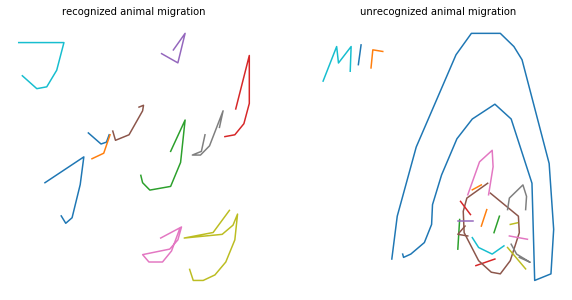

...

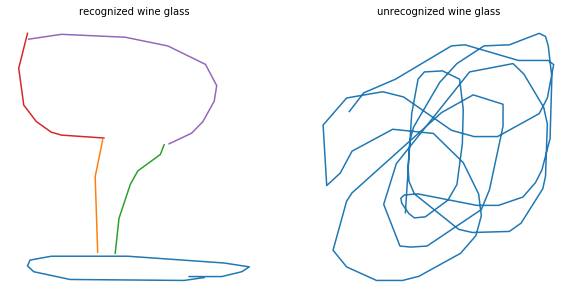

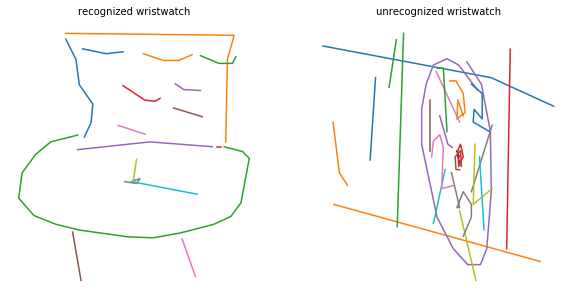

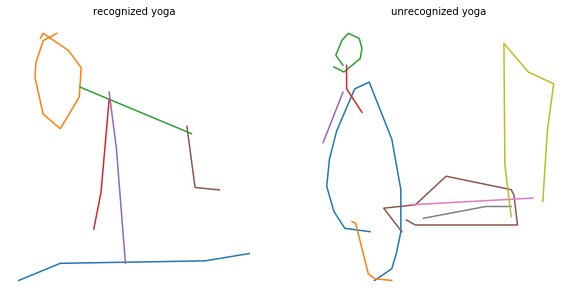

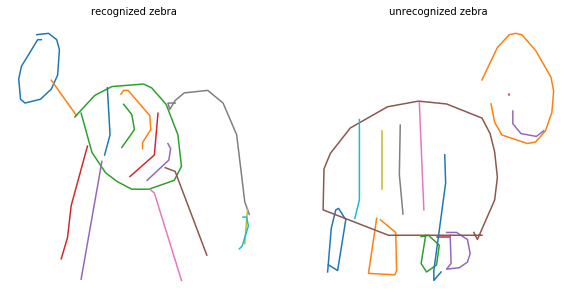

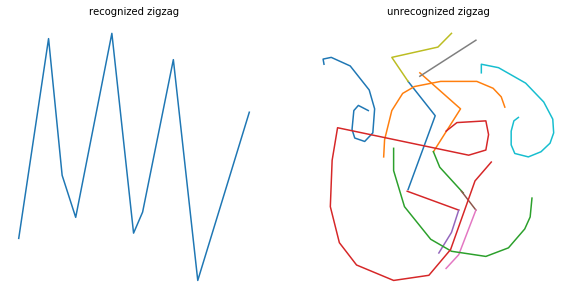

In [19]:
labels = df2.word.tolist()
for i, example in enumerate(example1s):
    plt.figure(figsize=(10,5))
    
    for x,y in example:
        plt.subplot(1,2,1)
        plt.plot(x, y)
        plt.axis('off')
        label = f"recognized {labels[i]}"
        plt.title(label, fontsize=10)
#     plt.gca().invert_xaxis()
    plt.gca().invert_yaxis()
        
    for x,y, in example2s[i]:
        plt.subplot(1,2,2)
        plt.plot(x, y)
        plt.axis('off')
        label = f"unrecognized {labels[i]}"
        plt.title(label, fontsize=10)
#     plt.gca().invert_xaxis()
    plt.gca().invert_yaxis()


    plt.show()

In [ ]:
def draw_doodle(strokes):
    image = Image.new("P", (256, 256), color=255)
    drawing = ImageDraw.Draw(image)
    for stroke in ast.literal_eval(strokes):
        for i in range(len(stroke[0])-1):
            drawing.line([stroke[0][i],    \
                          stroke[1][i],    \
                          stroke[0][i+1],  \
                          stroke[1][i+1]], \
                         fill=0, width=5)
            image = image.resize((imheight, imwidth))
            return np.array(image)/255.

array = draw_doodle(test)